In [2]:
import pandas as pd

In [3]:
%matplotlib notebook

Importing the CSV file into a dataframe and resetting the indices.

In [4]:
inc_div_full = pd.read_csv('https://raw.githubusercontent.com/leoRysing/DS-3000-final-project/main/composite/diversity_and_tuition_sorted.csv', index_col = 0)
inc_div_full.reset_index(drop=True, inplace=True)
inc_div_full

,name,total_enrollment,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment,total_price,year,campus,...,net_cost_over_110,state,state_code,type,degree_length,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total
0,Aaniiih Nakoda College,291.0,0.0,33.0,0.0,256.0,2.0,17030,2017,Off Campus,...,0.000000,Montana,MT,Public,2 Year,0.0,2380,2380,2380,2380
1,Aaniiih Nakoda College,291.0,0.0,33.0,0.0,256.0,2.0,17030,2018,Off Campus,...,0.000000,Montana,MT,Public,2 Year,0.0,2380,2380,2380,2380
2,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,48300,2017,On Campus,...,31205.917790,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
3,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,45980,2016,On Campus,...,29707.000000,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
4,Abilene Christian University,4427.0,46.0,2959.0,387.0,18.0,582.0,48300,2017,Off Campus,...,31205.917790,Texas,TX,Private,4 Year,10350.0,34850,45200,34850,45200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,Yuba College,6640.0,744.0,2846.0,262.0,79.0,2032.0,20510,2017,Off Campus,...,3209.760020,California,CA,Public,2 Year,0.0,1400,1400,8420,8420
9131,Yuba College,6640.0,744.0,2846.0,262.0,79.0,2032.0,21068,2018,Off Campus,...,3297.085525,California,CA,Public,2 Year,0.0,1400,1400,8420,8420
9132,Zane State College,4009.0,10.0,3170.0,110.0,16.0,14.0,14764,2018,Off Campus,...,10735.133290,Ohio,OH,Public,2 Year,0.0,5070,5070,9930,9930
9133,Zane State College,4009.0,10.0,3170.0,110.0,16.0,14.0,14254,2017,Off Campus,...,10364.304390,Ohio,OH,Public,2 Year,0.0,5070,5070,9930,9930


Dropping unnecessary columns and moving what will become our target variables to the end of the dataframe.

In [5]:
inc_div = inc_div_full.drop(['name', 'state'], axis=1)
inc_div_enrollment = inc_div.iloc[0:,1:6]
inc_div.drop(['asian_enrollment', 'white_enrollment', 'black_enrollment', 
              'american_indian_alaska_native_enrollment', 'hispanic_enrollment'], axis=1, inplace=True)

inc_div = pd.concat([inc_div, inc_div_enrollment], axis=1)
inc_div

,total_enrollment,total_price,year,campus,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,MT,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,MT,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,On Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,On Campus,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,Off Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,TX,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,Off Campus,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,CA,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,Off Campus,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,CA,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,Off Campus,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,OH,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,Off Campus,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,OH,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


Changing state abbreviations to numerical values 0-49.

In [6]:
state_numbers = {}
num = 0

for state in inc_div.state_code:
    if state not in state_numbers.keys():
        state_numbers[state] = num
        num = num + 1    
        
inc_div_codedstate = inc_div.replace({"state_code": state_numbers})  
inc_div_codedstate

,total_enrollment,total_price,year,campus,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,net_cost_over_110,state_code,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,Off Campus,8541.000000,7371.000000,0.000000,10492.000000,0.000000,0,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,On Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,On Campus,22071.000000,23643.000000,24895.000000,26930.000000,29707.000000,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,Off Campus,23184.630270,24835.948240,26151.120050,28288.799480,31205.917790,1,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,Off Campus,4936.642328,4926.170028,7659.440388,0.000000,3209.760020,4,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,Off Campus,5070.949809,5060.192596,7867.824968,0.000000,3297.085525,4,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,Off Campus,6057.890797,6545.768499,9734.756022,9689.159975,10735.133290,17,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,Off Campus,5848.630142,6319.654849,9398.483632,9354.462631,10364.304390,17,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


One-hot encoding the type column of the dataframe. This will create three new columns: public, private, and for-profit. Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other two columns. This gives us a way to represent this binary data (yes/no for each type of school) in a numerical way.

In [7]:
from sklearn.preprocessing import OneHotEncoder

pubpriv = inc_div_codedstate.iloc[:, 10:11]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(pubpriv)

pubpriv_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
pubpriv_df

,x0_For Profit,x0_Private,x0_Public
0,0.0,0.0,1.0
1,0.0,0.0,1.0
2,0.0,1.0,0.0
3,0.0,1.0,0.0
4,0.0,1.0,0.0
...,...,...,...
9130,0.0,0.0,1.0
9131,0.0,0.0,1.0
9132,0.0,0.0,1.0
9133,0.0,0.0,1.0


One-hot encoding the campus column of the dataframe. This will create two new columns: off-campus (no housing) and on-campus (has housing). Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other column. This gives us a way to represent this binary data (yes/no for on/off campus) in a numerical way.

In [8]:
campus = inc_div_codedstate.iloc[:, 3:4]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(campus)

campus_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
campus_df

,x0_Off Campus,x0_On Campus
0,1.0,0.0
1,1.0,0.0
2,0.0,1.0
3,0.0,1.0
4,1.0,0.0
...,...,...
9130,1.0,0.0
9131,1.0,0.0
9132,1.0,0.0
9133,1.0,0.0


One-hot encoding the degree length column of the dataframe. This will create two new columns: 2-year (associate's degree is highest degree offered) and 4-year (bachelor's degree is offered). Each school will have a 1 in one of the columns to represent which category it falls into, and will have a value of 0 for the other column. This gives us a way to represent this binary data (yes/no for highest degree offered) in a numerical way.

In [9]:
deglen = inc_div_codedstate.iloc[:, 11:12]

encoder = OneHotEncoder(sparse=False)
encoded_df = encoder.fit_transform(deglen)

deglen_df = pd.DataFrame(encoded_df, columns=encoder.get_feature_names())
deglen_df

,x0_2 Year,x0_4 Year
0,1.0,0.0
1,1.0,0.0
2,0.0,1.0
3,0.0,1.0
4,0.0,1.0
...,...,...
9130,1.0,0.0
9131,1.0,0.0
9132,1.0,0.0
9133,1.0,0.0


Merging the original dataframe and the newly-encoded dataframes into one dataframe.

In [10]:
inc_div_coded = pd.concat([inc_div_codedstate.iloc[:,0:3], pubpriv_df, 
                             inc_div_codedstate.iloc[:,4:10], campus_df, deglen_df,
                             inc_div_codedstate.iloc[:,12:22]], axis=1)

inc_div_coded.rename(columns={'x0_For Profit':'for_profit', 'x0_Private':'private', 
                              'x0_Public':'public', 'x0_Off Campus':'off_campus', 
                              'x0_On Campus':'on_campus', 'x0_2 Year':'two_year', 
                              'x0_4 Year':'four_year'}, inplace = True)

inc_div_coded.to_csv("inc_div_coded.csv")

inc_div_coded

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,asian_enrollment,white_enrollment,black_enrollment,american_indian_alaska_native_enrollment,hispanic_enrollment
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0.0,2380,2380,2380,2380,0.0,33.0,0.0,256.0,2.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,10350.0,34850,45200,34850,45200,46.0,2959.0,387.0,18.0,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,0.0,1400,1400,8420,8420,744.0,2846.0,262.0,79.0,2032.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,0.0,5070,5070,9930,9930,10.0,3170.0,110.0,16.0,14.0


Setting up the dataframe for target variable #1.

In [11]:
inc_div_target1 = inc_div_coded.drop(['white_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target1.rename(columns={'asian_enrollment':'target1'}, inplace = True)
inc_div_target1

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target1
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,744.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,744.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,10.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,10.0


In [12]:
features1 = inc_div_target1.drop(['target1'], axis=1)
target1 = inc_div_target1.target1
target1.describe()

count     9135.000000
mean       290.818719
std        779.314179
min          0.000000
25%         15.000000
50%         54.000000
75%        200.000000
max      10381.000000
Name: target1, dtype: float64

In [22]:
import plotly.express as plt
fig = plt.histogram(target1, nbins=10)
fig.show()

Setting up the dataframe for target variable #2.

In [13]:
inc_div_target2 = inc_div_coded.drop(['asian_enrollment', 'black_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target2.rename(columns={'white_enrollment':'target2'}, inplace = True)
inc_div_target2

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target2
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,33.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,33.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,2959.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,2959.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,2959.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,2846.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,2846.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,3170.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,3170.0


In [14]:
features2 = inc_div_target2.drop(['target2'], axis=1)
target2 = inc_div_target2.target2
target2.describe()

count     9135.000000
mean      3399.711330
std       4369.043621
min          0.000000
25%        813.000000
50%       1854.000000
75%       4145.000000
max      41898.000000
Name: target2, dtype: float64

In [23]:
fig = plt.histogram(target2, nbins=10)
fig.show()

Setting up the dataframe for target variable #3.

In [15]:
inc_div_target3 = inc_div_coded.drop(['white_enrollment', 'asian_enrollment', 'american_indian_alaska_native_enrollment', 
                                'hispanic_enrollment'], axis=1)
inc_div_target3.rename(columns={'black_enrollment':'target3'}, inplace = True)
inc_div_target3

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target3
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,0.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,387.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,387.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,387.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,262.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,262.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,110.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,110.0


In [16]:
features3 = inc_div_target3.drop(['target3'], axis=1)
target3 = inc_div_target3.target3
target3.describe()

count     9135.000000
mean       742.179967
std       1391.991834
min          0.000000
25%         81.000000
50%        234.000000
75%        778.000000
max      18914.000000
Name: target3, dtype: float64

In [24]:
fig = plt.histogram(target3, nbins=10)
fig.show()

Setting up the dataframe for target variable #4.

In [17]:
inc_div_target4 = inc_div_coded.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 'hispanic_enrollment'], 
                               axis=1)
inc_div_target4.rename(columns={'american_indian_alaska_native_enrollment':'target4'}, inplace = True)
inc_div_target4

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target4
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,256.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,256.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,18.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,18.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,79.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,79.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,16.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,16.0


In [18]:
features4 = inc_div_target4.drop(['target4'], axis=1)
target4 = inc_div_target4.target4
target4.describe()

count    9135.000000
mean       43.069732
std       128.621617
min         0.000000
25%         5.000000
50%        13.000000
75%        36.000000
max      2659.000000
Name: target4, dtype: float64

In [25]:
fig = plt.histogram(target4, nbins=10)
fig.show()

Setting up the dataframe for target variable #5.

In [26]:
inc_div_target5 = inc_div_coded.drop(['black_enrollment', 'asian_enrollment', 'white_enrollment', 
                                'american_indian_alaska_native_enrollment'], 
                               axis=1)
inc_div_target5.rename(columns={'hispanic_enrollment':'target5'}, inplace = True)
inc_div_target5

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total,target5
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,2.0
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380,2.0
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,582.0
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200,582.0
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200,582.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,2032.0
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420,2032.0
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,14.0
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930,14.0


In [27]:
features5 = inc_div_target5.drop(['target5'], axis=1)
target5 = inc_div_target5.target5
target5.describe()

count     9135.000000
mean       775.983908
std       2100.721550
min          0.000000
25%         52.000000
50%        173.000000
75%        594.000000
max      44870.000000
Name: target5, dtype: float64

In [28]:
fig = plt.histogram(target5, nbins=10)
fig.show()

In [29]:
inc_div_features = inc_div_coded.loc[:,"total_enrollment":"out_of_state_total"]
inc_div_features

,total_enrollment,total_price,year,for_profit,private,public,net_cost_0_to_30,net_cost_30_to_48,net_cost_48_to_75,net_cost_75_to_110,...,state_code,off_campus,on_campus,two_year,four_year,room_and_board,in_state_tuition,in_state_total,out_of_state_tuition,out_of_state_total
0,291.0,17030,2017,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380
1,291.0,17030,2018,0.0,0.0,1.0,8541.000000,7371.000000,0.000000,10492.000000,...,0,1.0,0.0,1.0,0.0,0.0,2380,2380,2380,2380
2,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200
3,4427.0,45980,2016,0.0,1.0,0.0,22071.000000,23643.000000,24895.000000,26930.000000,...,1,0.0,1.0,0.0,1.0,10350.0,34850,45200,34850,45200
4,4427.0,48300,2017,0.0,1.0,0.0,23184.630270,24835.948240,26151.120050,28288.799480,...,1,1.0,0.0,0.0,1.0,10350.0,34850,45200,34850,45200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9130,6640.0,20510,2017,0.0,0.0,1.0,4936.642328,4926.170028,7659.440388,0.000000,...,4,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420
9131,6640.0,21068,2018,0.0,0.0,1.0,5070.949809,5060.192596,7867.824968,0.000000,...,4,1.0,0.0,1.0,0.0,0.0,1400,1400,8420,8420
9132,4009.0,14764,2018,0.0,0.0,1.0,6057.890797,6545.768499,9734.756022,9689.159975,...,17,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930
9133,4009.0,14254,2017,0.0,0.0,1.0,5848.630142,6319.654849,9398.483632,9354.462631,...,17,1.0,0.0,1.0,0.0,0.0,5070,5070,9930,9930


<IPython.core.display.Javascript object>


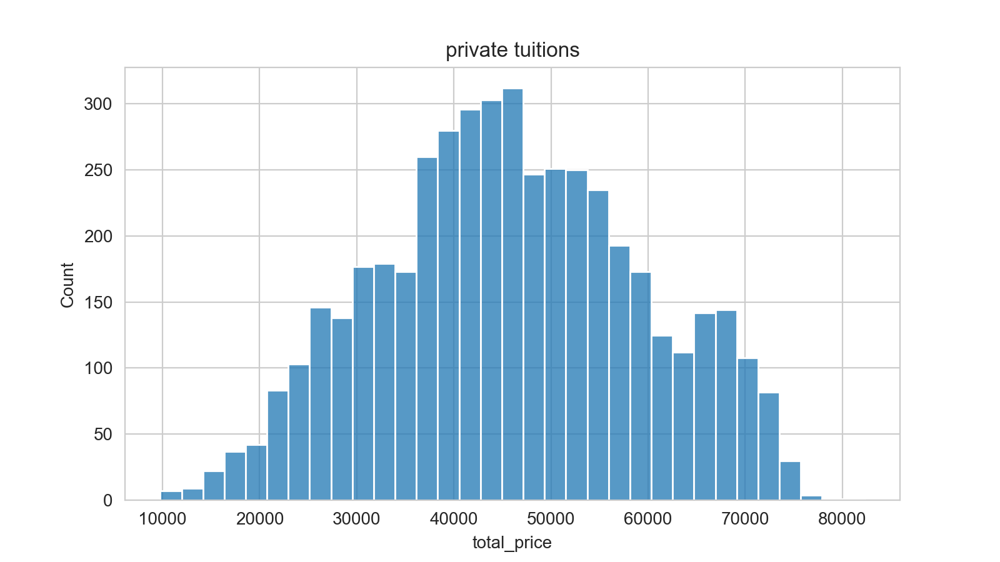

<IPython.core.display.Javascript object>


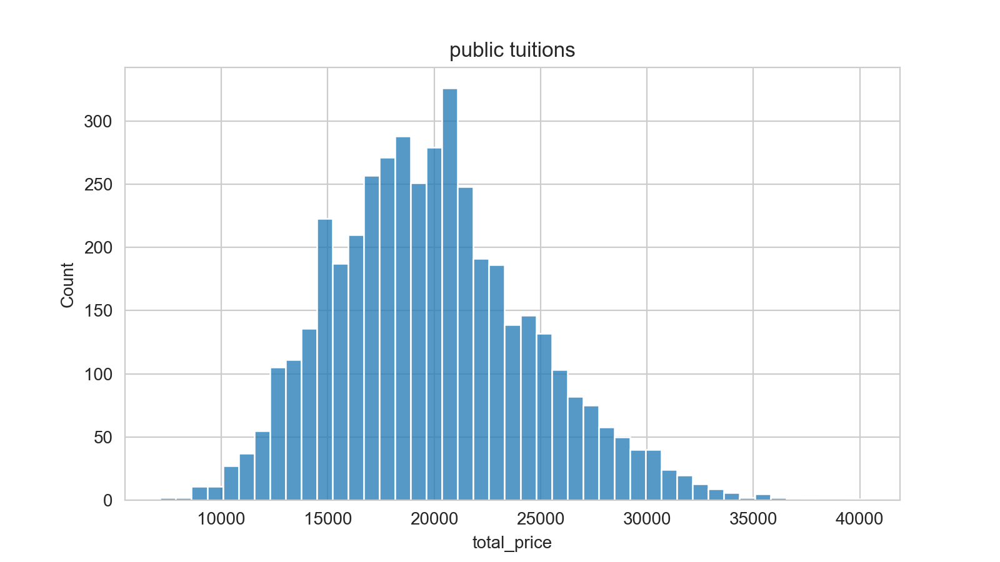

<IPython.core.display.Javascript object>


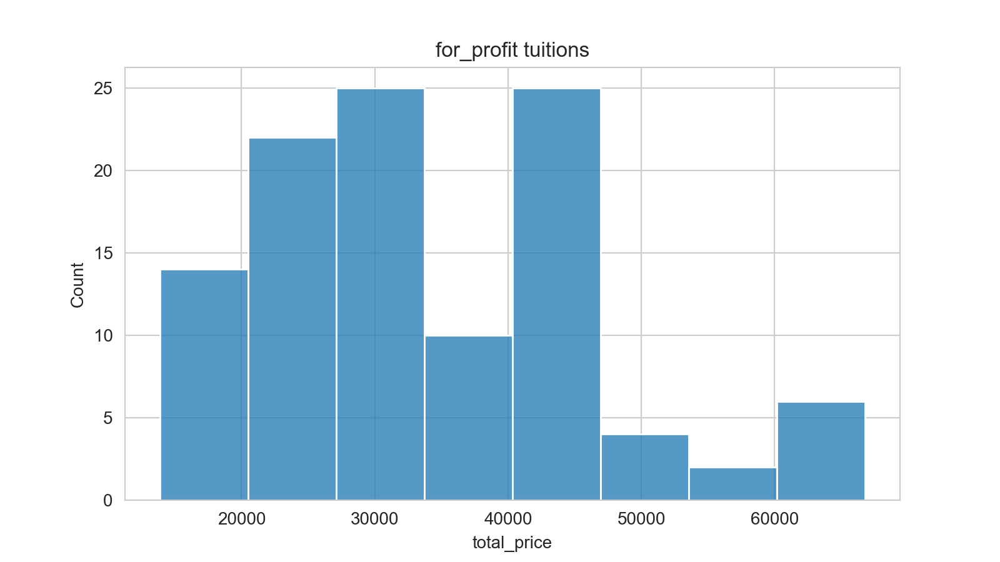

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
sns.set_style('whitegrid')

columns = {"for_profit", "private", "public"}
for column in columns:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features[column] == 1.0], x="total_price").set_title(
    column + " tuitions")
    plt.savefig("total-price-"+column+".png")

<IPython.core.display.Javascript object>


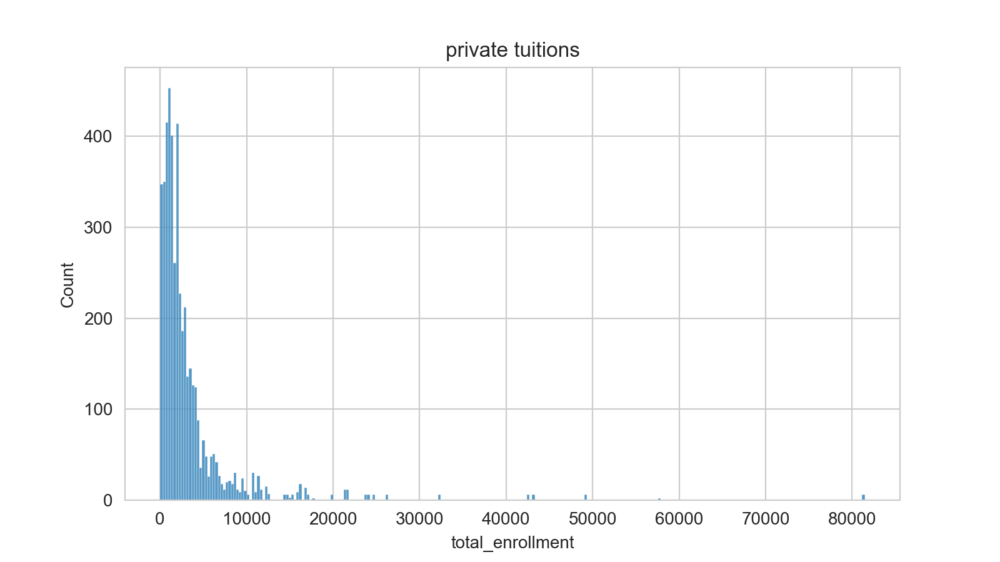

<IPython.core.display.Javascript object>


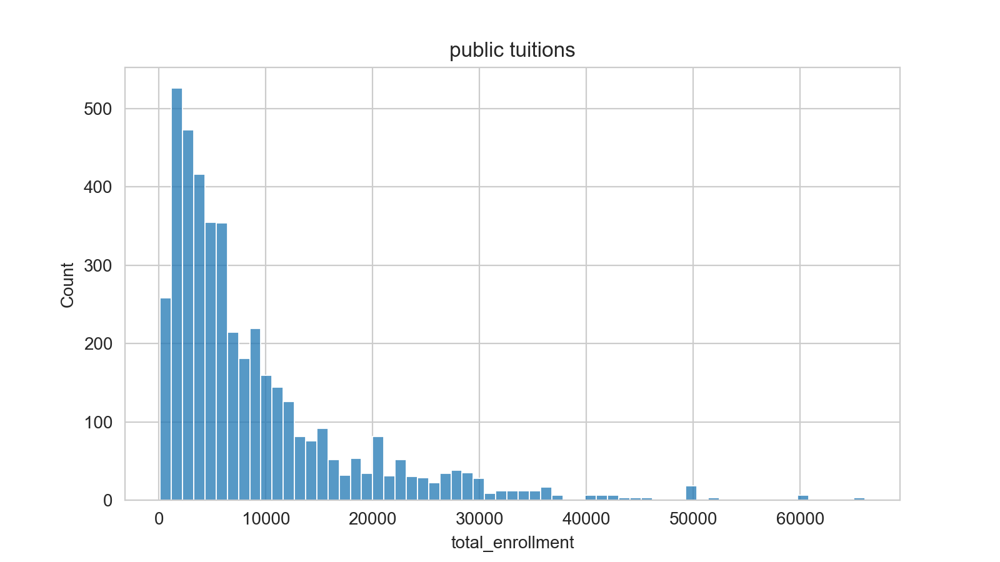

<IPython.core.display.Javascript object>


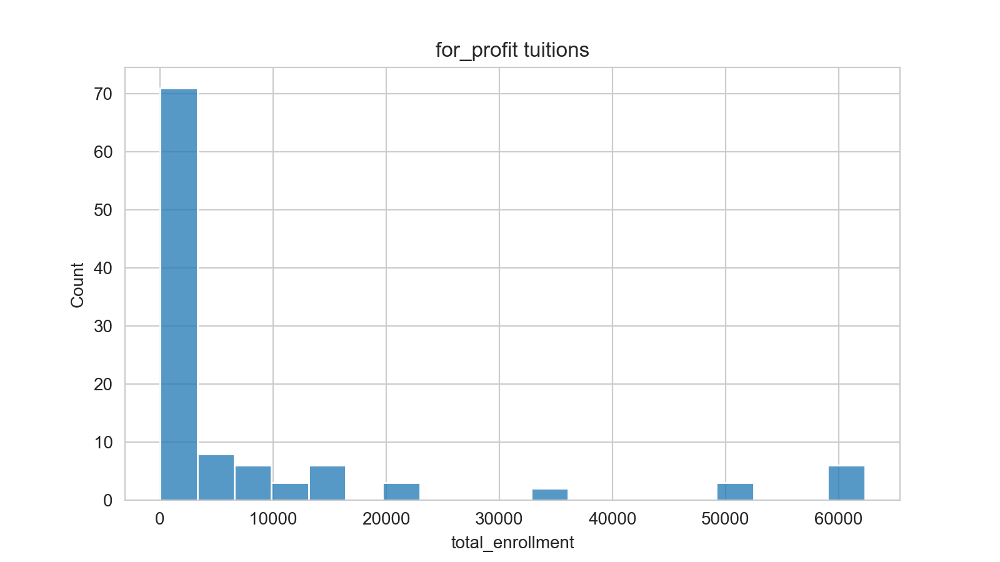

In [31]:
#histograms for school size
columns = {"for_profit", "private", "public"}
for column in columns:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features[column] == 1.0], x="total_enrollment").set_title(
    column + " tuitions")
    plt.savefig("corr"+column+".png")

<IPython.core.display.Javascript object>


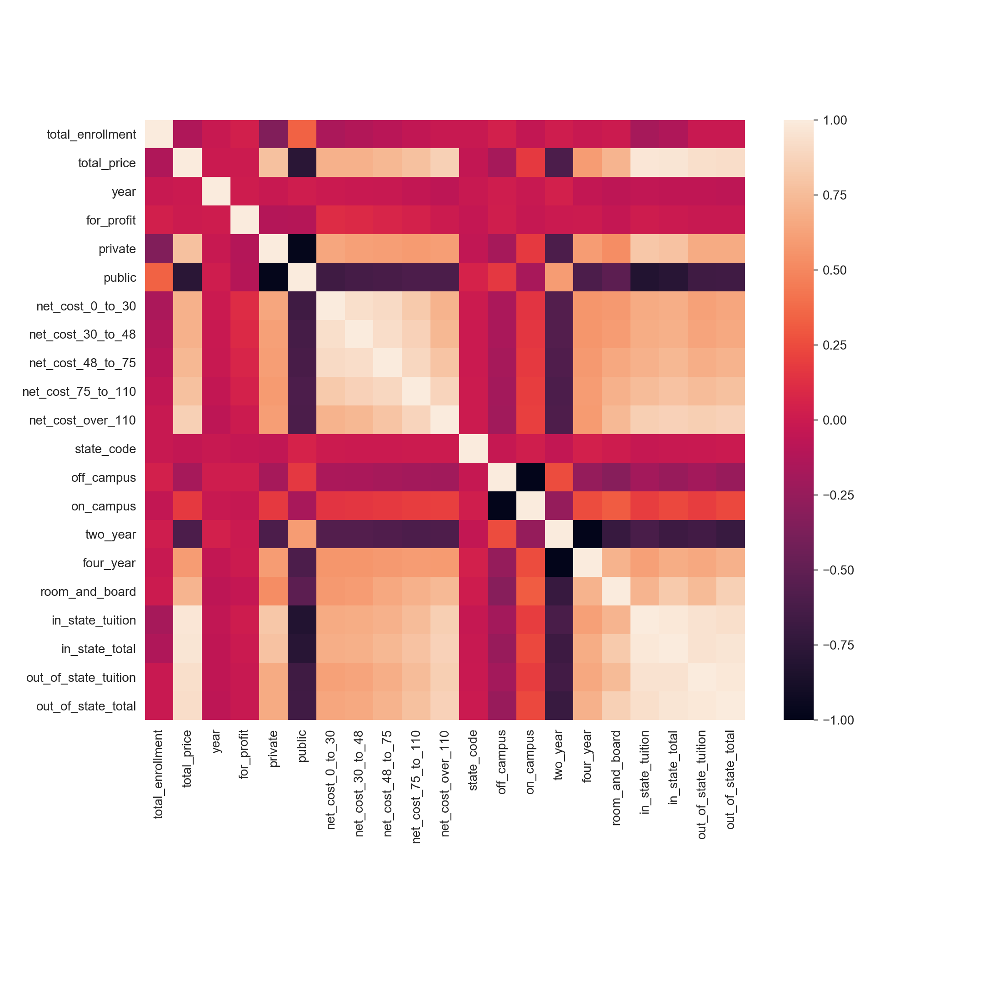

In [32]:
# heatmap showing correlations between all variables

plt.figure(figsize=(11, 11))
sns.heatmap(inc_div_features.corr(), square=True, annot=False)
plt.subplots_adjust(bottom=0.28)
plt.savefig("all-corrs.png")
plt.show()

<IPython.core.display.Javascript object>


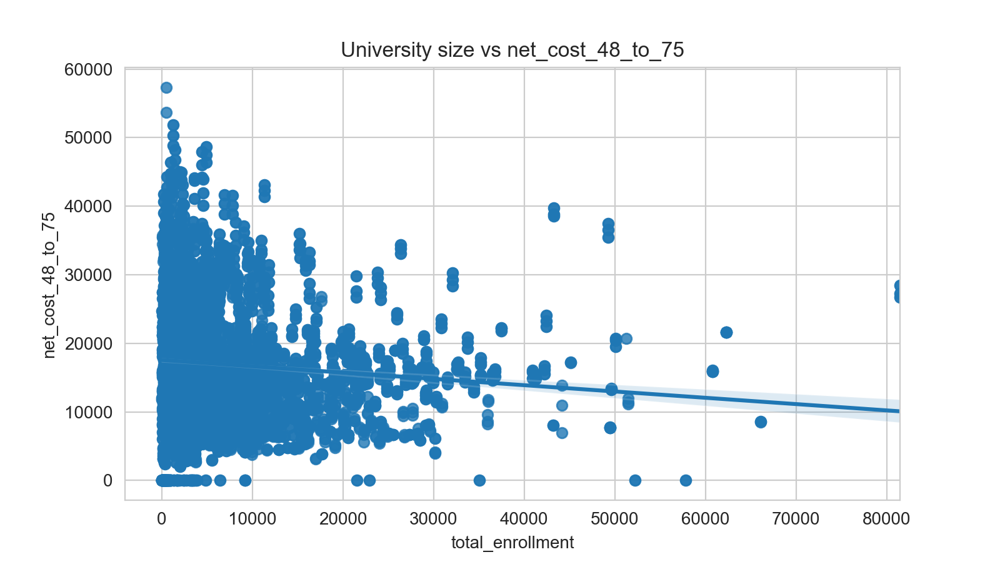

<IPython.core.display.Javascript object>


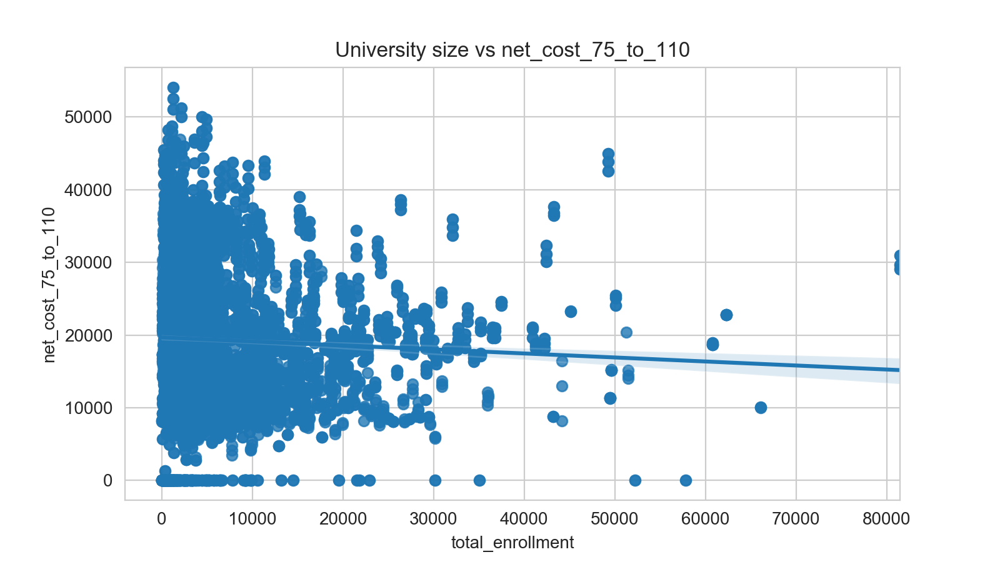

<IPython.core.display.Javascript object>


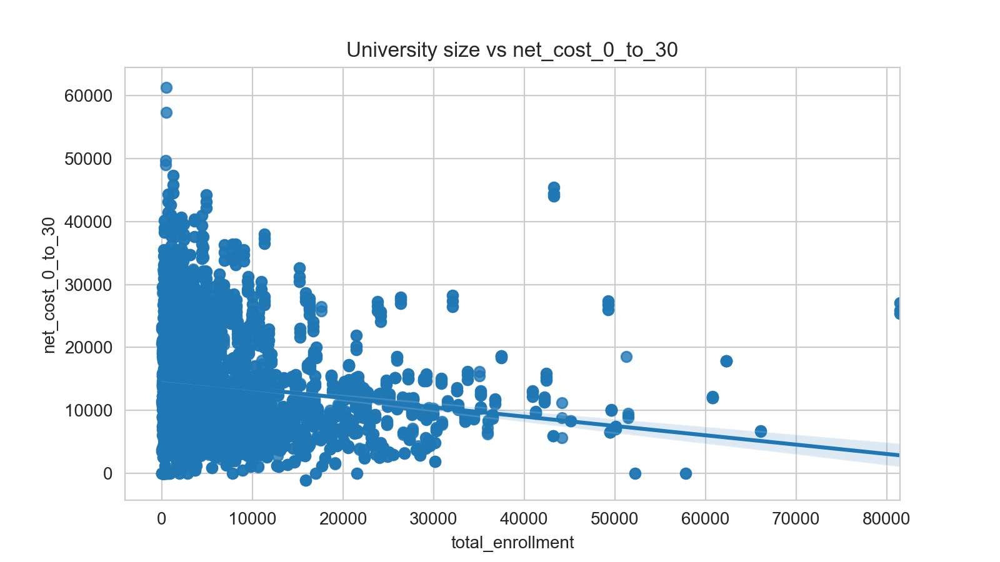

<IPython.core.display.Javascript object>


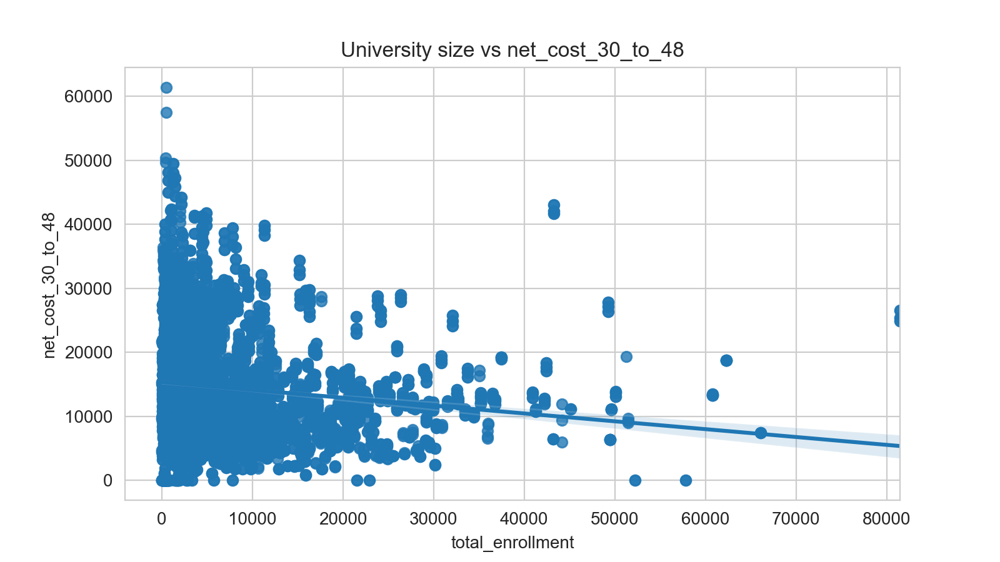

<IPython.core.display.Javascript object>


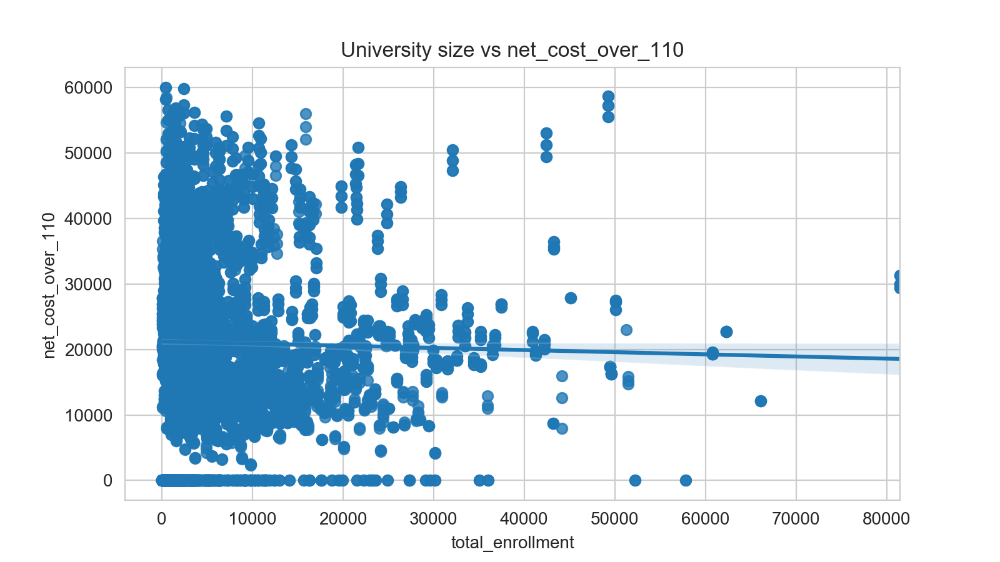

In [48]:

columns_mon = {"net_cost_0_to_30", "net_cost_30_to_48", 
               "net_cost_48_to_75", "net_cost_75_to_110", "net_cost_over_110"}
for column in columns_mon:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features, x='total_enrollment', y=column).set_title("University size vs " + column)
    plt.savefig("corr"+column+".png")
    
#takeaway; it seems that despite some variation, especially in the smaller schools,
#there isn't much of a correlation

<IPython.core.display.Javascript object>


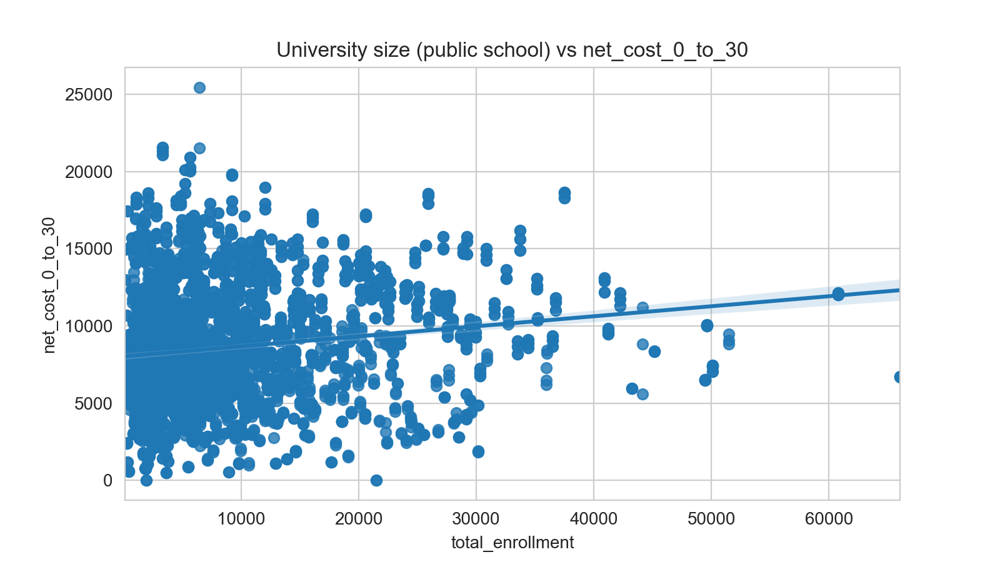

<IPython.core.display.Javascript object>


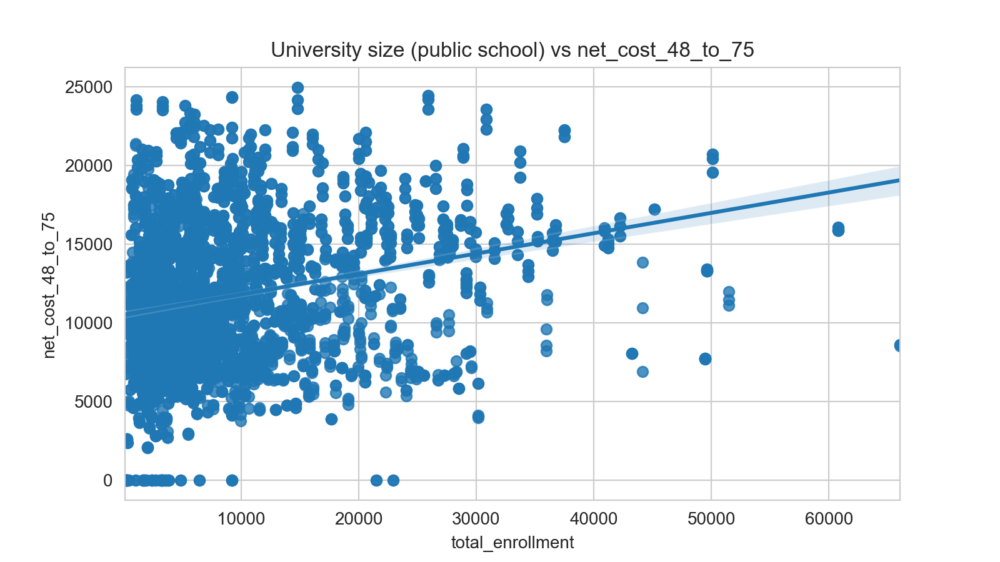

<IPython.core.display.Javascript object>


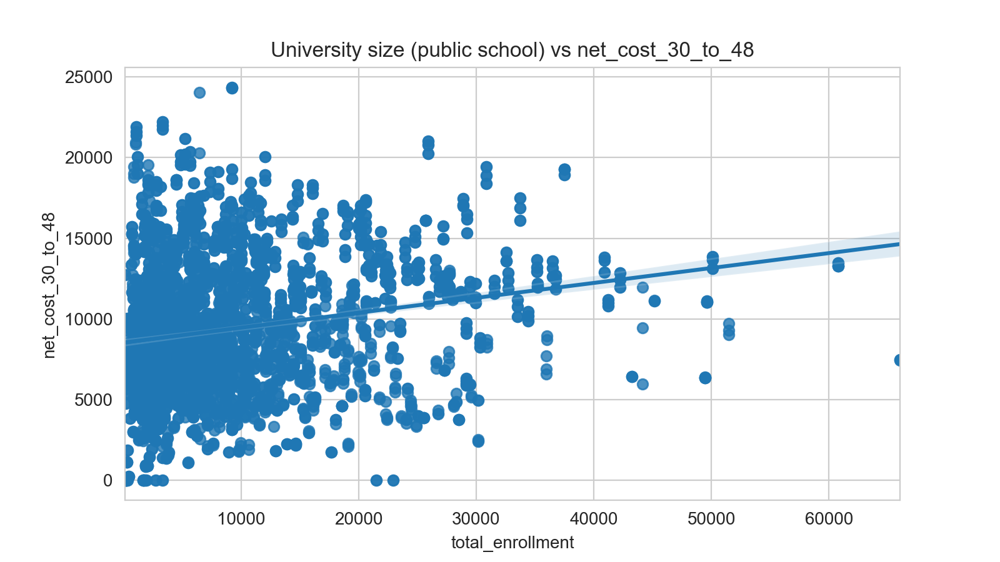

In [34]:
columns_mon_2 = {"net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75"}

for column in columns_mon_2:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features[inc_div_features["public"] == 1.0], x='total_enrollment', y=column).set_title(
        "University size (public school) vs " + column)
    plt.savefig("corr"+column+"total-enrollement(public).png")
#public schools show an upward trend for their tuition    

<IPython.core.display.Javascript object>


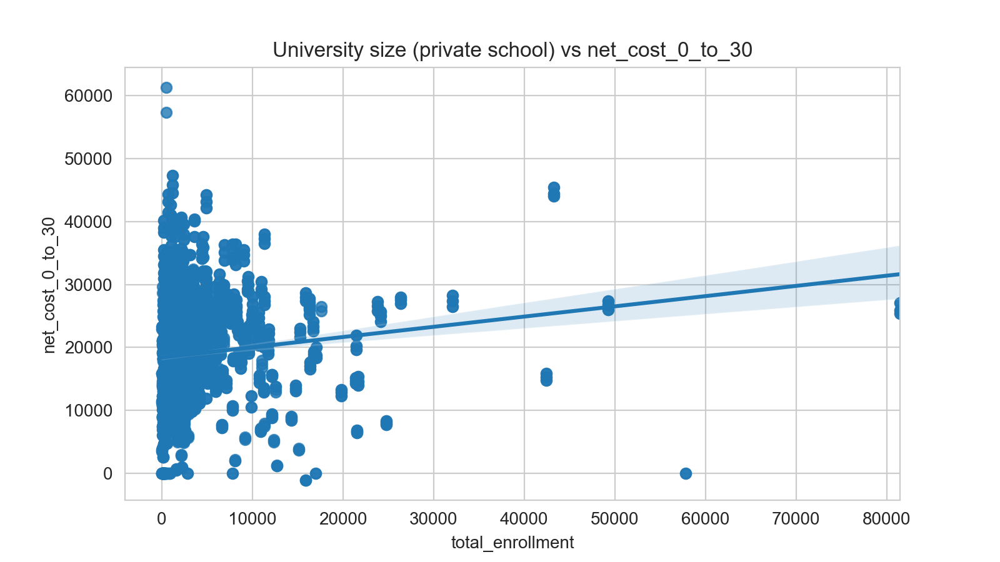

<IPython.core.display.Javascript object>


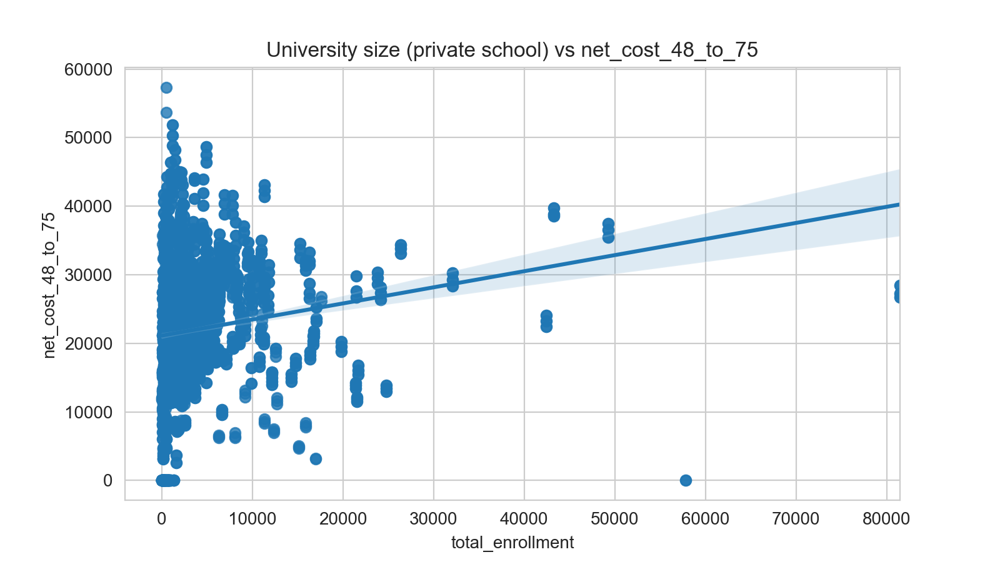

<IPython.core.display.Javascript object>


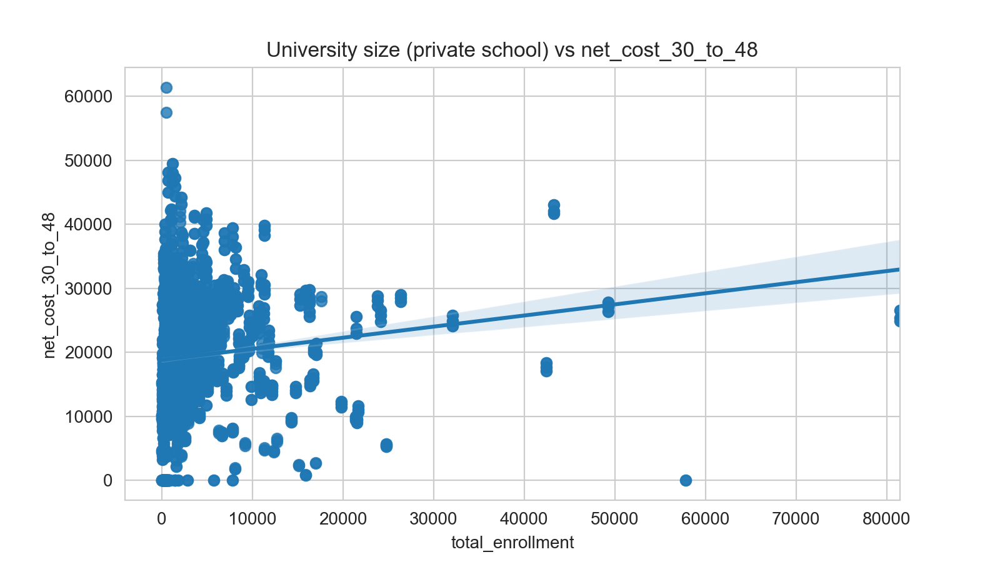

In [35]:
for column in columns_mon_2:
    plt.figure(figsize=(8, 4.5))  # 8"-by-4.5" Figure
    sns.regplot(data=inc_div_features[inc_div_features["private"] == 1.0], x='total_enrollment', y=column).set_title(
        "University size (private school) vs " + column)
    plt.savefig("corr"+column+"total-enrollement(private).png")
#private schools also show an upward trend for their tuition    

<IPython.core.display.Javascript object>


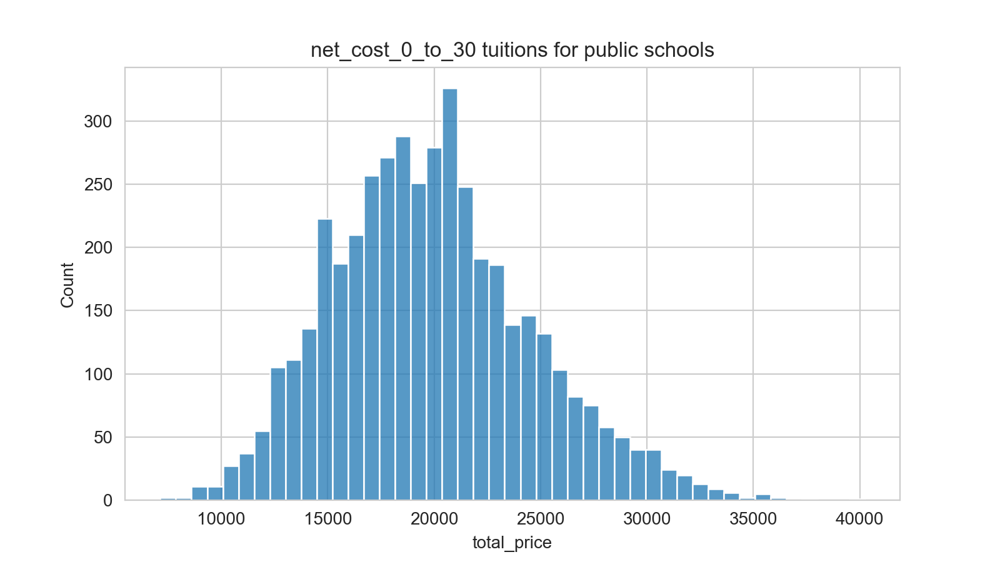

<IPython.core.display.Javascript object>


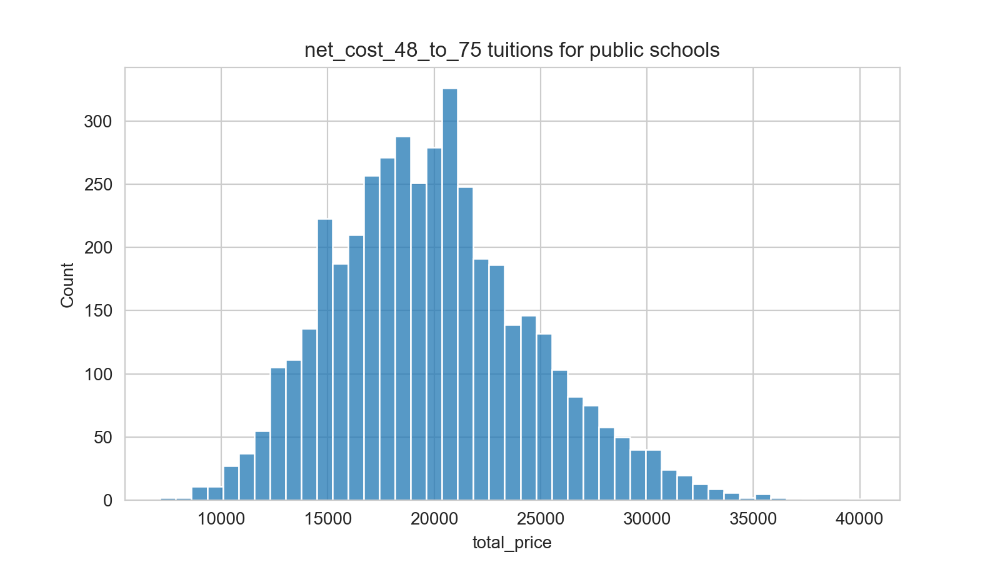

<IPython.core.display.Javascript object>


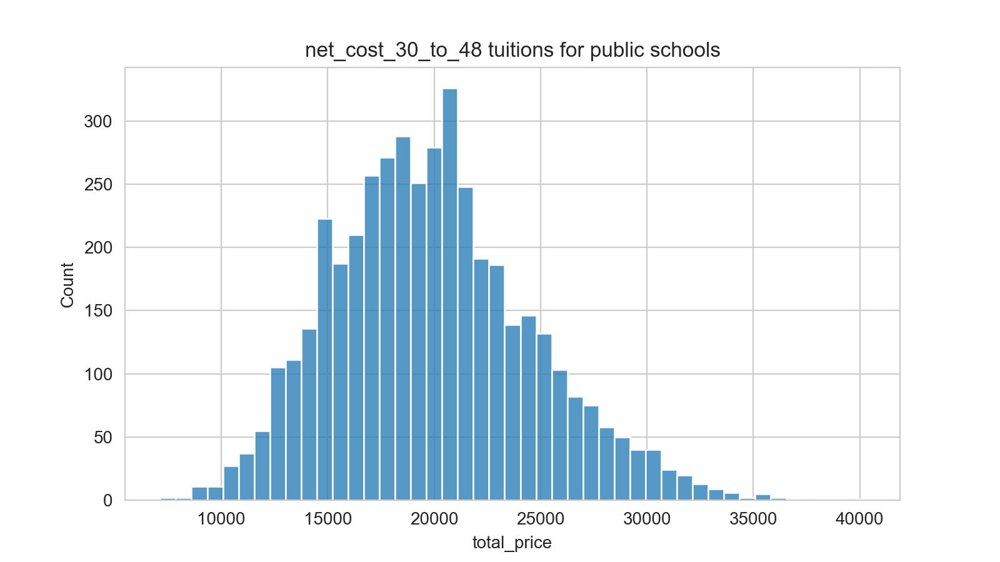

In [36]:
#tuitions for public schools
columns2 = {"net_cost_0_to_30", "net_cost_30_to_48", "net_cost_48_to_75"}
for column in columns2:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features["public"] == 1.0], x="total_price").set_title(
    column + " tuitions for public schools" )
    plt.savefig("tuition-cost-"+column+"-public.png")

<IPython.core.display.Javascript object>


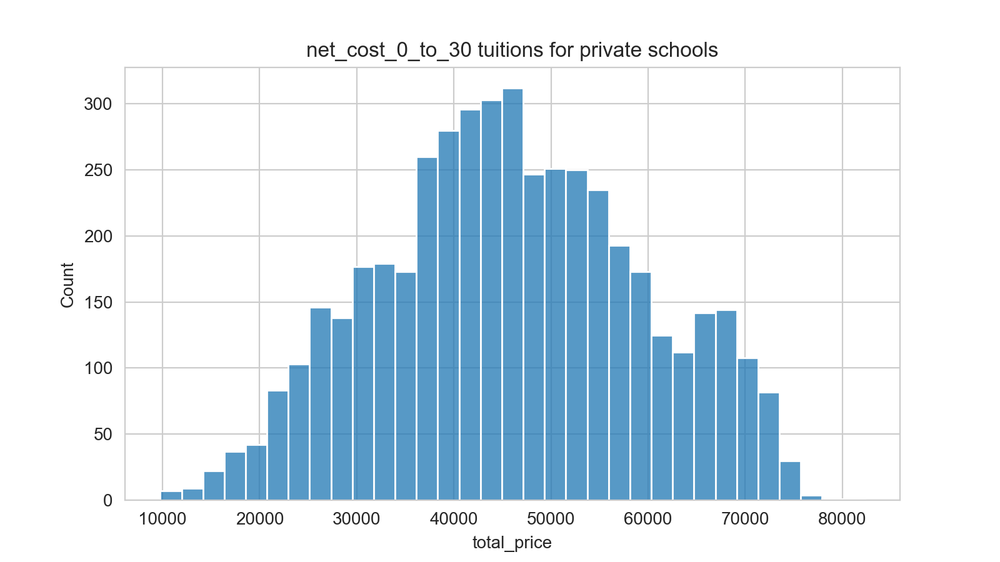

<IPython.core.display.Javascript object>


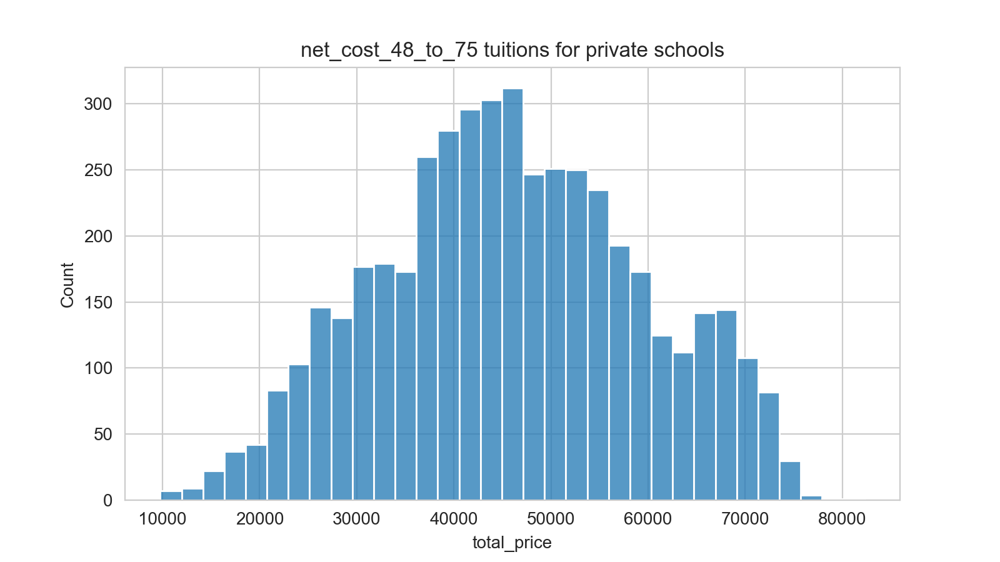

<IPython.core.display.Javascript object>


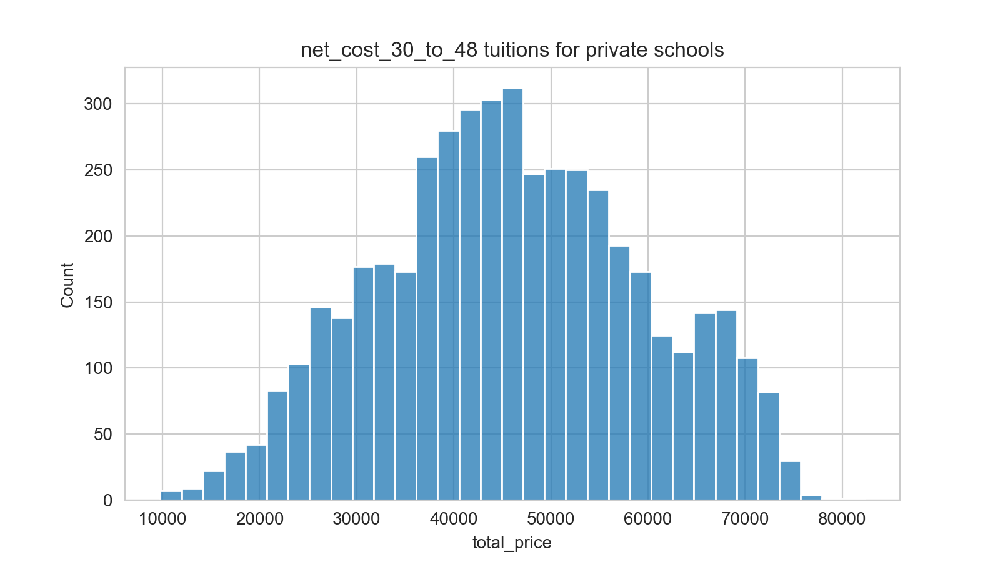

In [37]:
#tuitions for private schools
for column in columns2:
    plt.figure(figsize=(8, 4.5))
    sns.histplot(data=inc_div_features[inc_div_features["private"] == 1.0], x="total_price").set_title(
    column + " tuitions for private schools" )
    plt.savefig("tuition-cost-"+column+"-private.png")

In [38]:
plt.figure(figsize=(10, 7))
sns.lineplot(data=inc_div_features, palette = "colorblind", x = "state_code", y="total_price", hue="year").set_title(
    "average tuition by state over the years")
plt.savefig("ave-cost-by-state.png")

<IPython.core.display.Javascript object>